# Proyecto Uber

## Predicción de demanda de Uber

El objetivo de este proyecto es predecir la demanda de Uber en New York en función de la
hora utilizando datos históricos. Para eso se utilizarán datos de 4.5 millones de pickups de
Uber.
Datos: http://bit.ly/2wpe260

## Datos

Este directorio contiene datos sobre más de 4,5 millones de recolecciones de Uber en la ciudad de Nueva York de abril a septiembre de 2014, y 14,3 millones más de recolecciones de Uber de enero a junio de 2015. También incluye datos a nivel de viaje de otras 10 compañías de vehículos de alquiler (FHV). como datos agregados para 329 empresas FHV, también se incluye. Todos los archivos están tal como se recibieron el 3 de agosto, el 15 de septiembre y el 22 de septiembre de 2015.

FiveThirtyEight obtuvo los datos de la Comisión de Taxis y Limusinas de la Ciudad de Nueva York (TLC) al enviar una solicitud de la Ley de Libertad de Información el 20 de julio de 2015. La TLC nos ha enviado los datos en lotes mientras continúa revisando los datos de viaje que Uber y otras compañías de HFV han sometido a ella. La correspondencia de la TLC con FiveThirtyEight se incluye en los archivos TLC_letter.pdf, TLC_letter2.pdf y TLC_letter3.pdf. Las solicitudes de registros de TLC se pueden hacer aquí.

Estos datos se usaron para cuatro historias de FiveThirtyEight: Uber presta servicios a los distritos exteriores de Nueva York más que los taxis, el transporte público debería ser el nuevo mejor amigo de Uber, Uber está quitando millones de viajes en Manhattan a los taxis y Uber está generando tráfico en las horas pico de la ciudad de Nueva York ¿Peor?.

### The dataset contains, roughly, four groups of files:

- Uber trip data from 2014 (April - September), separated by month, with detailed location information
- Uber trip data from 2015 (January - June), with less fine-grained location information
- non-Uber FHV (For-Hire Vehicle) trips. The trip information varies by company, but can include day of trip, time of trip, pickup location, driver's for-hire license number, and vehicle's for-hire license number.
- aggregate ride and vehicle statistics for all FHV companies (and, occasionally, for taxi companies)

### Columnas Archivos 2014

- Date/Time : The date and time of the Uber pickup
- Lat : The latitude of the Uber pickup
- Lon : The longitude of the Uber pickup
- Base : The TLC base company code affiliated with the Uber pickup


## Librerias

In [185]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import train_test_split
import geopy
from sklearn.cluster import KMeans
from sklearn.linear_model import ElasticNetCV

In [196]:
# Gráficos
# ==============================================================================
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

In [197]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [198]:
# Configuración matplotlib
# ==============================================================================
plt.rcParams['image.cmap'] = "bwr"
#plt.rcParams['figure.dpi'] = "100"
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

## Lectura Archivos Año 2014 y 2015

In [212]:
archivos2014 =['uber-raw-data-may14.csv',
                'uber-raw-data-apr14.csv',
                'uber-raw-data-jul14.csv',
                'uber-raw-data-jun14.csv',
                'uber-raw-data-sep14.csv',
                'uber-raw-data-aug14.csv']
df2014 = pd.DataFrame()
for file in archivos2014:
    df = pd.read_csv(file,encoding='utf-8')
    df2014 = pd.concat([df,df2014])

In [296]:
#df2015 = pd.read_csv("uber-raw-data-janjune-15.csv")

In [214]:
## Respaldo en excel
#df2014.to_excel('DF2014.xlsx', index=False)

In [215]:
df2014.head(5)

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.73660,-73.99060,B02512
1,8/1/2014 0:09:00,40.72600,-73.99180,B02512
2,8/1/2014 0:12:00,40.72090,-74.05070,B02512
3,8/1/2014 0:12:00,40.73870,-73.98560,B02512
4,8/1/2014 0:12:00,40.73230,-74.00770,B02512


In [216]:
#df2015.shape

In [217]:
df2014.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4534327 entries, 0 to 652434
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   Date/Time  4534327 non-null  object 
 1   Lat        4534327 non-null  float64
 2   Lon        4534327 non-null  float64
 3   Base       4534327 non-null  object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [297]:
#df2015.info(verbose=True,null_counts=True)

In [219]:
#df2015 = df2015.rename(columns={'Pickup_date':'Date/Time', 'Dispatching_base_num': 'Base Num' })

In [220]:
df2014['Date/Time'] = pd.to_datetime(df2014['Date/Time'], format="%m/%d/%Y %H:%M:%S")
#df2015['Date/Time'] = pd.to_datetime(df2015['Date/Time'], format="%Y/%m/%d %H:%M:%S")

In [221]:
## Año 2014
df2014['DiaSemana'] = df2014['Date/Time'].dt.dayofweek
df2014['DiaMes'] = df2014['Date/Time'].dt.day
df2014['Hora'] = df2014['Date/Time'].dt.hour
df2014['DiaNombre'] = df2014['Date/Time'].dt.day_name()
df2014['Mes'] = df2014['Date/Time'].dt.month
## Año 2015
#df2015['DiaSemana'] = df2015['Date/Time'].dt.dayofweek
#df2015['DiaMes'] = df2015['Date/Time'].dt.day
#df2015['Hora'] = df2015['Date/Time'].dt.hour
#df2015['DiaNombre'] = df2015['Date/Time'].dt.day_name()
#df2015['Mes'] = df2015['Date/Time'].dt.month

In [222]:
df2014.head(5)

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,4,1,0,Friday,8
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,4,1,0,Friday,8
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,4,1,0,Friday,8
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,4,1,0,Friday,8
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,4,1,0,Friday,8


In [223]:
#Contar los duplicados
df2014.duplicated().sum()

82581

Eliminamos los duplicados

In [224]:
df2014.drop_duplicates(inplace=True)
#df2015.drop_duplicates(inplace=True)

In [225]:
df2014.shape

(4451746, 9)

## Análisis Exploratorio

In [226]:
df2014.describe()

,Lat,Lon,DiaSemana,DiaMes,Hora,Mes
count,4451746.00000,4451746.00000,4451746.00000,4451746.00000,4451746.00000,4451746.00000
mean,40.73924,-73.97304,2.96763,15.93756,14.21754,6.82331
std,0.03984,0.05722,1.87615,8.74571,5.95758,1.70388
min,39.65690,-74.92900,0.00000,1.00000,0.00000,4.00000
25%,40.72110,-73.99650,1.00000,9.00000,10.00000,5.00000
50%,40.74220,-73.98340,3.00000,16.00000,15.00000,7.00000
75%,40.76100,-73.96530,5.00000,23.00000,19.00000,8.00000
max,42.11660,-72.06660,6.00000,31.00000,23.00000,9.00000


<AxesSubplot:xlabel='DiaMes'>

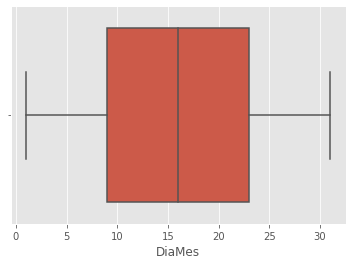

In [227]:
#sns.boxplot(x=df2014["Lat"])
#sns.boxplot(x=df2014["Lon"])
#sns.boxplot(x=df2014["DiaSemana"])
sns.boxplot(x=df2014["DiaMes"])
#sns.boxplot(x=df2014["Hora"])
#sns.boxplot(x=df2014["Mes"])

In [228]:
df2014.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4451746 entries, 0 to 652434
Data columns (total 9 columns):
 #   Column     Non-Null Count    Dtype         
---  ------     --------------    -----         
 0   Date/Time  4451746 non-null  datetime64[ns]
 1   Lat        4451746 non-null  float64       
 2   Lon        4451746 non-null  float64       
 3   Base       4451746 non-null  object        
 4   DiaSemana  4451746 non-null  int64         
 5   DiaMes     4451746 non-null  int64         
 6   Hora       4451746 non-null  int64         
 7   DiaNombre  4451746 non-null  object        
 8   Mes        4451746 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(2)
memory usage: 339.6+ MB


In [229]:
df2014.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
DiaSemana    0
DiaMes       0
Hora         0
DiaNombre    0
Mes          0
dtype: int64

In [230]:
df2014.isnull().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
DiaSemana    0
DiaMes       0
Hora         0
DiaNombre    0
Mes          0
dtype: int64

Cambiamos el número de los días de la semana

In [231]:
##Año 2014
df2014['DiaSemana'] = df2014['DiaSemana'].replace(6, 7)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(5, 6)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(4, 5)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(3, 4)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(2, 3)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(1, 2)
df2014['DiaSemana'] = df2014['DiaSemana'].replace(0, 1)
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Monday', 'Lunes')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Tuesday', 'Martes')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Wednesday', 'Miercoles')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Thursday', 'Jueves')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Friday', 'Viernes')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Saturday', 'Sábado')
df2014['DiaNombre'] = df2014['DiaNombre'].replace('Sunday', 'Domingo')
##Año 2015
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(6, 7)
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(5, 6)
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(4, 5)
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(3, 4)
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(2, 3)
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(1, 2)
#df2015['DiaSemana'] = df2015['DiaSemana'].replace(0, 1)
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Monday', 'Lunes')
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Tuesday', 'Martes')
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Wednesday', 'Miercoles')
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Thursday', 'Jueves')
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Friday', 'Viernes')
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Saturday', 'Sábado')
#df2015['DiaNombre'] = df2015['DiaNombre'].replace('Sunday', 'Domingo')

In [232]:
def esFinde(dia):
    if dia == 'Sábado' or dia == 'Domingo' :
        return 0
    else:
        return 1

### Creamos atributos es fin de semana

In [233]:
df2014['DiaLaboral'] = df2014['DiaNombre'].apply(esFinde)

In [234]:
df2014.head()

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,DiaLaboral
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,5,1,0,Viernes,8,1
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,5,1,0,Viernes,8,1
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,5,1,0,Viernes,8,1
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,5,1,0,Viernes,8,1
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,5,1,0,Viernes,8,1


### Cantidad de viajes por día

In [235]:
df2014.groupby(['DiaSemana', 'DiaNombre']).size().reset_index(name='Cantidad')

,DiaSemana,DiaNombre,Cantidad
0,1,Lunes,532133
1,2,Martes,651753
2,3,Miercoles,683604
3,4,Jueves,741372
4,5,Viernes,727532
5,6,Sábado,634194
6,7,Domingo,481158


<AxesSubplot:>

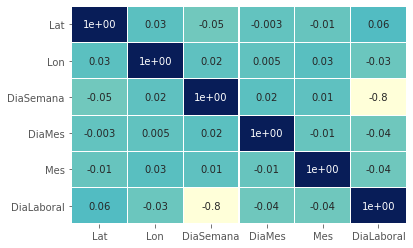

In [236]:
#plt.figure(figsize=(14,14))
sns.heatmap(df2014.iloc[:,[1,2,3,4,5,8,9]].corr(), annot = True, fmt='.0', linewidths=.1, cmap="YlGnBu", cbar=False)
#sns.heatmap(df2015.iloc[:,[1,2,3,4,5,6,8,9]].corr(), annot = True, fmt='.0%', linewidths=.1, cmap="YlGnBu", cbar=False)
#df2014.iloc[:,[1,2,3,4,5,8]]

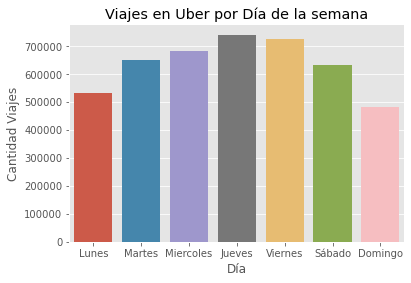

In [237]:
plt.figure(figsize=(6,4))
order_day = ['Lunes', 'Martes', 'Miercoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
sns.countplot(data=df2014,x='DiaNombre', order = order_day)
plt.ylabel('Cantidad Viajes')
plt.xlabel('Día')
plt.title('Viajes en Uber por Día de la semana')
plt.show()

In [238]:
Count_FDS = df2014['DiaLaboral'].value_counts()
print(Count_FDS)
list = ["Día Laboral", "Fin de Semana"]
#print(list_diagnosis)

1    3336394
0    1115352
Name: DiaLaboral, dtype: int64


<function matplotlib.pyplot.show(close=None, block=None)>

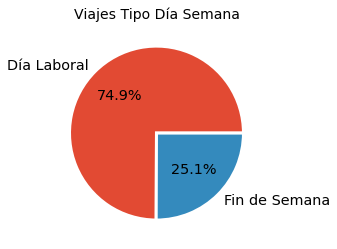

In [239]:
plt.subplots(figsize=(4, 4))
plt.pie(Count_FDS, labels= list, autopct='%.1f%%', wedgeprops={'linewidth': 3.0, 'edgecolor': 'white'},
        textprops={'size': 'x-large'})
plt.title("Viajes Tipo Día Semana", fontsize = 14)
plt.show

#### Viajes por Mes

In [240]:
df2014.groupby(['Mes']).size().reset_index(name='Cantidad')

,Mes,Cantidad
0,4,556767
1,5,642360
2,6,653158
3,7,781969
4,8,813393
5,9,1004099


In [241]:
#df2014['Mes'].value_counts()

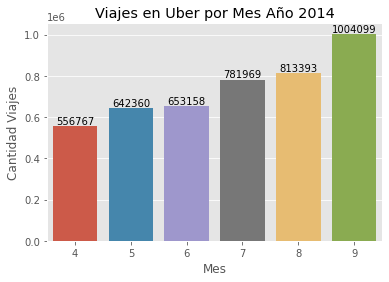

In [242]:
plt.figure(figsize=(6,4))
ax = sns.countplot(data=df2014,x='Mes')
plt.ylabel('Cantidad Viajes')
plt.xlabel('Mes')
plt.title ('Viajes en Uber por Mes Año 2014')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width()/2.0,rect.get_height(),int(rect.get_height()), ha='center', va='bottom')
plt.show()

### Viajes por Hora y Mes

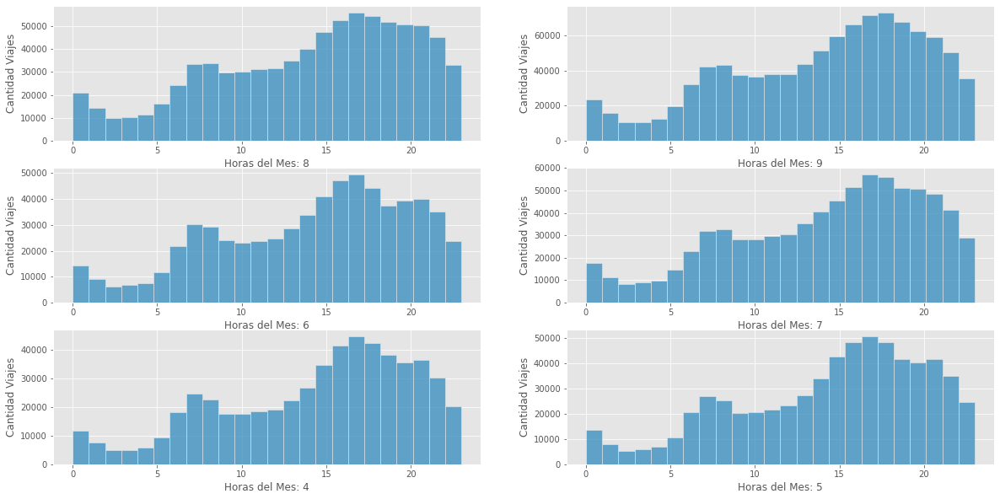

In [243]:
plt.figure(figsize=(20,10))
for i,mes in enumerate(df2014['Mes'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=df2014,x=df2014[df2014['Mes'] == mes]['Hora'],bins=24)
    plt.xlabel('Horas del Mes: {}'.format(mes))
    plt.ylabel('Cantidad Viajes')

- Visualizamos que la cantidad de viajes es similar en todos los meses
- Entre las 14 y 22 horas es la mayor demanda de viajes
- Entre las 0 y 5 horas es baja la demanda

### Viajes por Día Mes

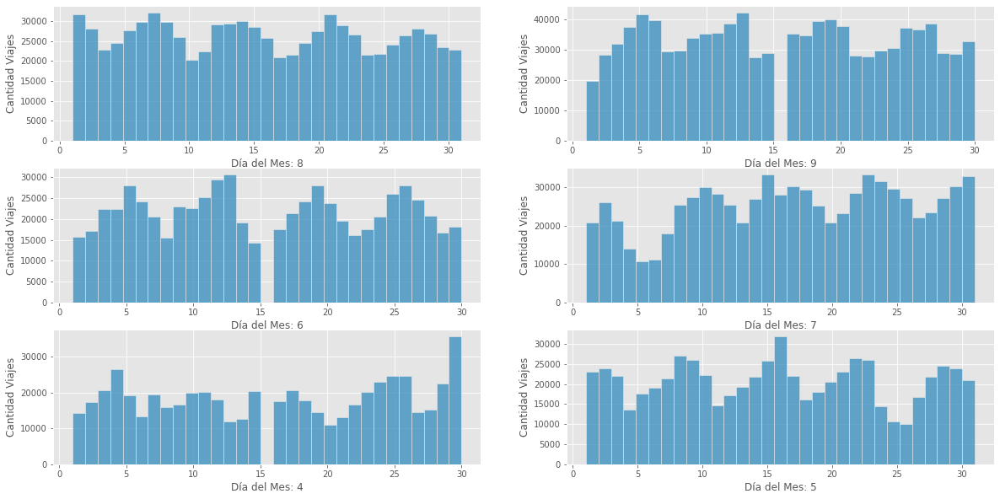

In [244]:
plt.figure(figsize=(20,10))
for i,mes in enumerate(df2014['Mes'].unique()):
    plt.subplot(3,2,i+1)
    sns.histplot(data=df2014,x=df2014[df2014['Mes'] == mes]['DiaMes'],bins=31)
    plt.xlabel('Día del Mes: {}'.format(mes))
    plt.ylabel('Cantidad Viajes')

- Un día al mes no existen viajes, tendriamos que revidar para ver la posible razón y ver si afecta a nuestro análisis
- Durante los días de la semana aumenta la demanda, disminuyendo los fines de semana

In [245]:
#df2015.info()

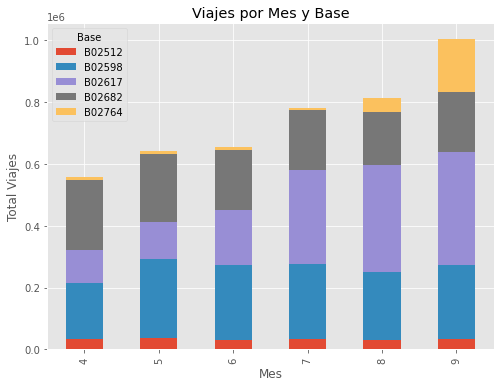

In [246]:
df2014.groupby(['Base','Mes']).count().unstack('Base')['Date/Time'].plot(kind='bar', figsize = (8,6),stacked=True)
plt.ylabel('Total Viajes')
plt.title('Viajes por Mes y Base');

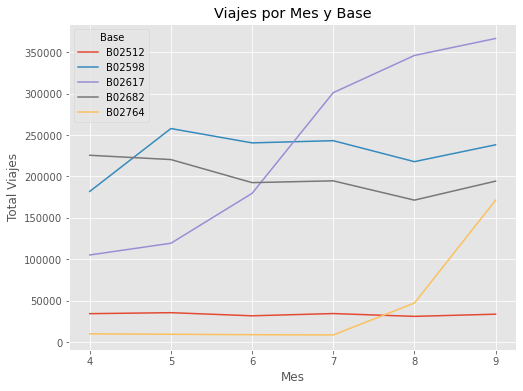

In [247]:
df2014.groupby(['Base','Mes']).count().unstack('Base')['Date/Time'].plot(figsize = (8,6))
plt.ylabel('Total Viajes')
plt.title('Viajes por Mes y Base');

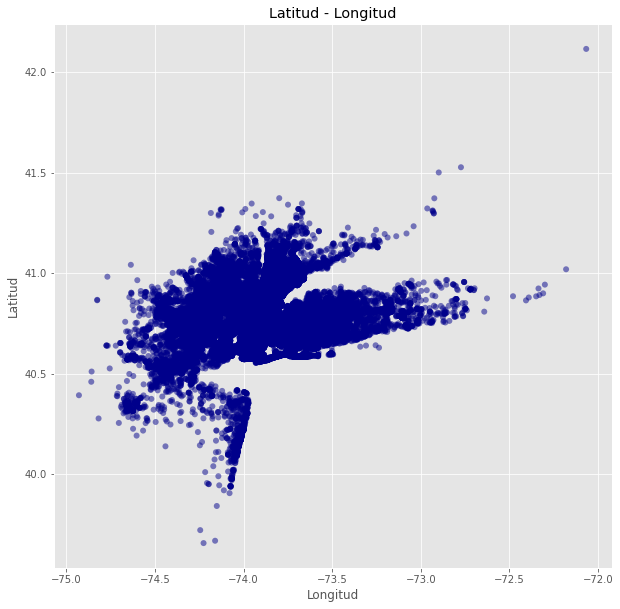

In [248]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='Lon',y='Lat',data=df2014,edgecolor='None',alpha=0.5,color='darkblue')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.title('Latitud - Longitud')
plt.show()

In [249]:
coordinates = df2014.groupby(['Lat', 'Lon'])['DiaSemana'].count().reset_index()
coordinates.columns=['Lat', 'Lon', 'no of trips']
coordinates

,Lat,Lon,no of trips
0,39.65690,-74.22580,1
1,39.66860,-74.16070,1
2,39.72140,-74.24460,1
3,39.84160,-74.15120,1
4,39.90550,-74.07910,1
...,...,...,...
574553,41.37300,-72.92370,1
574554,41.37370,-73.79880,1
574555,41.50160,-72.89870,1
574556,41.52760,-72.77340,1


In [250]:
#!pip install folium

In [251]:
from folium.plugins import HeatMap

In [252]:
import folium

In [253]:
basemap = folium.Map()

In [254]:
HeatMap(coordinates,zoom=5,radius=15).add_to(basemap)
basemap

### Clustering

In [133]:
df_lat_long = df2014[['Lat', 'Lon']]

In [48]:
scores = []

for i in range(2, 11):
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(df_lat_long)
    scores.append(km.inertia_)

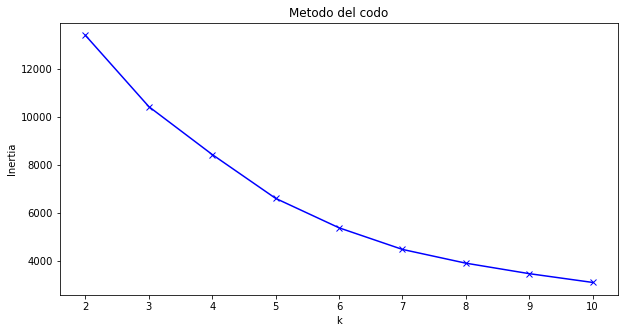

In [134]:
plt.figure(figsize=(10,5))
plt.plot(range(2,11), scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('Metodo del codo')
plt.show()

In [50]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=0)
kmeans.fit(df_lat_long)
y_kmeans = kmeans.predict(df_lat_long)

In [255]:
df2014['cluster'] = y_kmeans

In [256]:
df_cluster = pd.get_dummies(df2014['cluster'],prefix='cluster')
df2014['cluster0'] = df_cluster['cluster_0']
df2014['cluster1'] = df_cluster['cluster_1']
df2014['cluster2'] = df_cluster['cluster_2']
df2014['cluster3'] = df_cluster['cluster_3']
df2014['cluster4'] = df_cluster['cluster_4']
df2014['cluster5'] = df_cluster['cluster_5']

In [137]:
new_locacion = [(40.69884,-74.20232)]
kmeans.predict(new_locacion)

array([4])

In [138]:
centroids = kmeans.cluster_centers_
centroids

array([[ 40.79683578, -73.87446955],
       [ 40.73130026, -73.99808718],
       [ 40.66552912, -73.76259427],
       [ 40.76628862, -73.97227178],
       [ 40.69883988, -74.20232073],
       [ 40.68749313, -73.9643531 ]])

In [139]:
clocation = pd.DataFrame()
clocation['Latitude'] = centroids[:,0]
clocation['Longitude'] = centroids[:,1]
clocation = clocation.reset_index(level=0)
clocation=clocation.rename(columns = {'index':'Cluster'})
clocation

,Cluster,Latitude,Longitude
0,0,40.79684,-73.87447
1,1,40.73130,-73.99809
2,2,40.66553,-73.76259
3,3,40.76629,-73.97227
4,4,40.69884,-74.20232
5,5,40.68749,-73.96435


In [140]:
df2014.shape

(4451746, 17)

In [141]:
df2014.tail()

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,DiaLaboral,cluster,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5
652430,2014-05-31 23:45:00,40.73090,-74.00140,B02764,6,31,23,Sábado,5,0,1,0,1,0,0,0,0
652431,2014-05-31 23:52:00,40.75280,-73.97980,B02764,6,31,23,Sábado,5,0,3,0,0,0,1,0,0
652432,2014-05-31 23:55:00,40.71580,-73.95190,B02764,6,31,23,Sábado,5,0,5,0,0,0,0,0,1
652433,2014-05-31 23:56:00,40.69610,-73.89970,B02764,6,31,23,Sábado,5,0,5,0,0,0,0,0,1
652434,2014-05-31 23:59:00,40.73930,-73.99190,B02764,6,31,23,Sábado,5,0,1,0,1,0,0,0,0


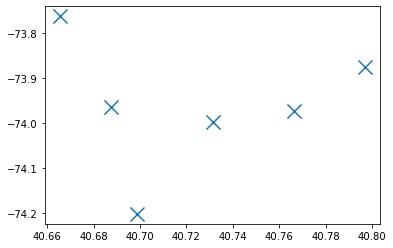

In [142]:
plt.scatter(clocation['Latitude'], clocation['Longitude'], marker = 'x', s = 200)
plt.show()

In [143]:
lat = clocation['Latitude']
lon = clocation['Longitude']
result = []
for i in range(len(lat)):
    result.append((lat[i], lon[i]))
print(result)

[(40.796835779465496, -73.87446954785453), (40.731300257621434, -73.99808718069711), (40.665529116286905, -73.76259426740864), (40.76628862281498, -73.97227178087341), (40.69883987793385, -74.20232072656285), (40.687493130651205, -73.96435310081301)]


In [144]:
result

[(40.796835779465496, -73.87446954785453),
 (40.731300257621434, -73.99808718069711),
 (40.665529116286905, -73.76259426740864),
 (40.76628862281498, -73.97227178087341),
 (40.69883987793385, -74.20232072656285),
 (40.687493130651205, -73.96435310081301)]

In [145]:
#centroid = clocation.values.tolist()
centroid = result
map = folium.Map(location=[40.79658011772687, -73.87341741832425], zoom_start = 10)

for point in range(0, len(centroid)):
    folium.Marker(
        centroid[point],
        #popup = centroid[point]).add_to(map)
        popup = point).add_to(map)
map

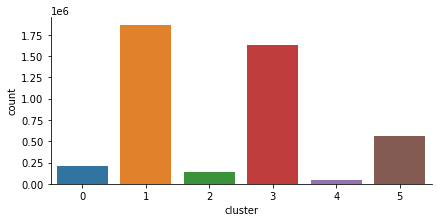

In [146]:
sns.catplot(data = df2014, x = 'cluster', kind = 'count', height = 3,aspect = 2)

In [257]:
df_lluvias = pd.read_excel("Lluvia.xlsx")
X2 = pd.merge(df2014, df_lluvias, how='left', left_on=['Hora', 'Mes','DiaMes'], right_on=['hora', 'mes', 'Dia'])
X2= X2.drop(['año', 'mes', 'Dia', 'hora', 'New York'], axis=1)

In [258]:
X2

,Date/Time,Lat,Lon,Base,DiaSemana,DiaMes,Hora,DiaNombre,Mes,DiaLaboral,cluster,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,Lluvia,temp
0,2014-08-01 00:03:00,40.73660,-73.99060,B02512,5,1,0,Viernes,8,1,1,0,1,0,0,0,0,0,297.51000
1,2014-08-01 00:09:00,40.72600,-73.99180,B02512,5,1,0,Viernes,8,1,1,0,1,0,0,0,0,0,297.51000
2,2014-08-01 00:12:00,40.72090,-74.05070,B02512,5,1,0,Viernes,8,1,1,0,1,0,0,0,0,0,297.51000
3,2014-08-01 00:12:00,40.73870,-73.98560,B02512,5,1,0,Viernes,8,1,1,0,1,0,0,0,0,0,297.51000
4,2014-08-01 00:12:00,40.73230,-74.00770,B02512,5,1,0,Viernes,8,1,1,0,1,0,0,0,0,0,297.51000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4451741,2014-05-31 23:45:00,40.73090,-74.00140,B02764,6,31,23,Sábado,5,0,1,0,1,0,0,0,0,0,292.80000
4451742,2014-05-31 23:52:00,40.75280,-73.97980,B02764,6,31,23,Sábado,5,0,3,0,0,0,1,0,0,0,292.80000
4451743,2014-05-31 23:55:00,40.71580,-73.95190,B02764,6,31,23,Sábado,5,0,5,0,0,0,0,0,1,0,292.80000
4451744,2014-05-31 23:56:00,40.69610,-73.89970,B02764,6,31,23,Sábado,5,0,5,0,0,0,0,0,1,0,292.80000


# Entrenamiento y predicción

In [259]:
# Configuración warnings
# ==============================================================================
import warnings
warnings.filterwarnings('ignore')

#### Creamos un DF con las variables que vamos a utilizar y se agrega la variable dependiente con la cantidad de viajes

In [260]:
datos_2=X2.groupby(['DiaMes','DiaSemana','Hora','DiaLaboral', 'Lluvia', 'temp','Mes','cluster0','cluster1','cluster2','cluster3','cluster4','cluster5'])['Date/Time'].count().reset_index()
datos_2.rename(columns = {'Lluvia':'lluvia', 'Date/Time':'flujo','DiaSemana':'dia_sem'}, inplace = True)
datos_2.head()

,DiaMes,dia_sem,Hora,DiaLaboral,lluvia,temp,Mes,cluster0,cluster1,cluster2,cluster3,cluster4,cluster5,flujo
0,1,1,0,1,0,298.01000,9,0,0,0,0,0,1,175
1,1,1,0,1,0,298.01000,9,0,0,0,0,1,0,9
2,1,1,0,1,0,298.01000,9,0,0,0,1,0,0,147
3,1,1,0,1,0,298.01000,9,0,0,1,0,0,0,32
4,1,1,0,1,0,298.01000,9,0,1,0,0,0,0,291


Correlación entre columnas numéricas

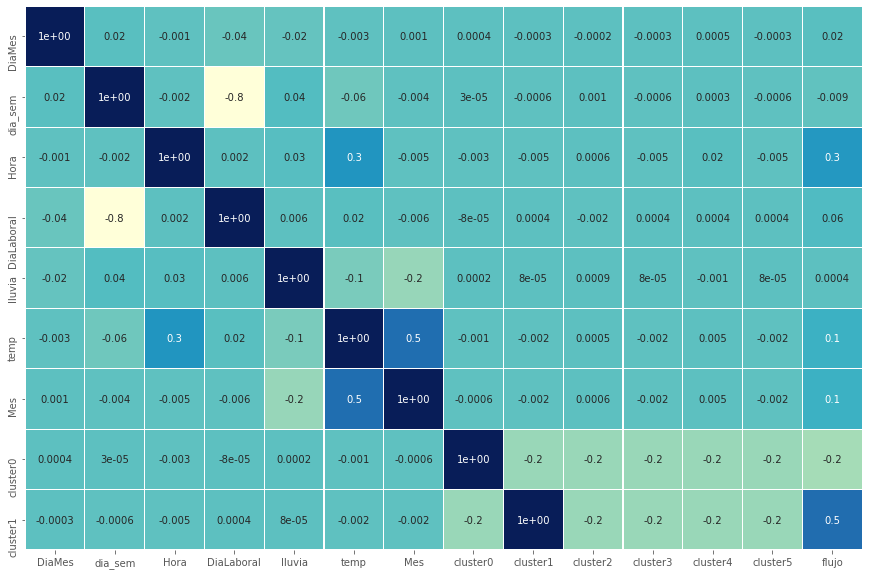

In [261]:
data = datos_2.corr(method='pearson')
plt.figure(figsize=(15, 10))
sns.heatmap(data[0:9], annot=True,fmt='.0', linewidths=.1, cmap="YlGnBu", cbar=False)
plt.show()

In [262]:
import statsmodels.formula.api as smf
reg = smf.ols('flujo ~ DiaMes + Hora + DiaLaboral + lluvia + temp + Mes + dia_sem + cluster0 + cluster1+ cluster2 + cluster3 + cluster4 +cluster5',data=datos_2)
#reg = smf.ols('flujo ~ DiaMes + Hora + DiaLaboral + lluvia + temp + Mes + dia_sem + Lat + Lon',data=datos_2)
modelo = reg.fit()
print(modelo.summary())

                            OLS Regression Results                            
Dep. Variable:                  flujo   R-squared:                       0.618
Model:                            OLS   Adj. R-squared:                  0.618
Method:                 Least Squares   F-statistic:                     3520.
Date:                Mon, 13 Jun 2022   Prob (F-statistic):               0.00
Time:                        15:04:36   Log-Likelihood:            -1.6705e+05
No. Observations:               26140   AIC:                         3.341e+05
Df Residuals:                   26127   BIC:                         3.342e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     41.8954     41.416      1.012      0.3

In [263]:
# División de los datos en train y test
# ==============================================================================
X = datos_2.drop(columns='flujo')
y = datos_2[('flujo')]

X_train, X_test, y_train, y_test = train_test_split(
                                        X,
                                        y.values.reshape(-1,1),
                                        train_size   = 0.7,
                                        random_state = 1234,
                                        shuffle      = True
                                    )

In [264]:
print("X_train ",X_train.shape)
print("y_train ",y_train.shape)
print("X_test ",X_test.shape)
print("y_test ",y_test.shape)

X_train  (18298, 13)
y_train  (18298, 1)
X_test  (7842, 13)
y_test  (7842, 1)


Creación y entrenamiento del modelo

In [265]:
modelo = LinearRegression(normalize=True)
modelo.fit(X = X_train, y = y_train)

LinearRegression(normalize=True)

Información del modelo

In [1]:
# ==============================================================================
#print("Intercept:", modelo.intercept_)
#print("Coeficiente:", list(zip(X.columns, modelo.coef_.flatten(), )))
#print("Coeficiente de determinación R^2:", modelo.score(X, y))

Una vez entrenado el modelo, se evalúa la capacidad predictiva empleando el conjunto de test.

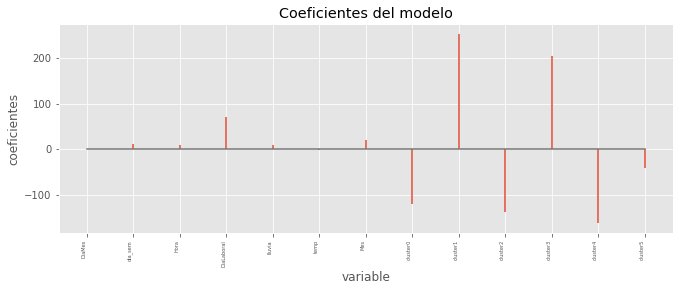

In [267]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': modelo.coef_.flatten()}
                  )

fig, ax = plt.subplots(figsize=(11, 3.84))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=5)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');

In [268]:
# Predicciones test
# ==============================================================================
predicciones = modelo.predict(X=X_test)
predicciones = predicciones.flatten()
predicciones[:5]

array([ 202.81332644,   29.98417797,  255.32133475, -102.46630569,
         68.23317787])

In [269]:
# Error de test del modelo 
# ==============================================================================
rmse_ols = mean_squared_error(
            y_true  = y_test,
            y_pred  = predicciones,
            squared = False
           )
print("")
print(f"El error (rmse) de test es: {rmse_ols}")


El error (rmse) de test es: 145.50517351223618


Las predicciones del modelo final se alejan en promedio 145.5 unidades del valor real.

## RIDGE

In [270]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
# ==============================================================================
# Por defecto RidgeCV utiliza el mean squared error
modelo = RidgeCV(
            alphas          = np.logspace(-10, 2, 200),
            fit_intercept   = True,
            normalize       = True,
            store_cv_values = True
         )

_ = modelo.fit(X = X_train, y = y_train)

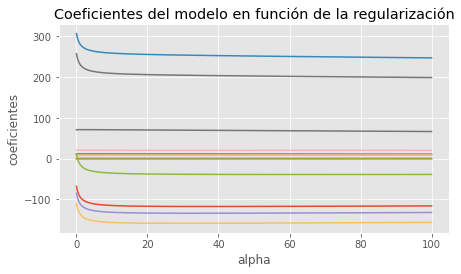

In [271]:
# Evolución de los coeficientes en función de alpha
# ==============================================================================
alphas = modelo.alphas
coefs = []

for alpha in alphas:
    modelo_temp = Ridge(alpha=alpha, fit_intercept=False, normalize=True)
    modelo_temp.fit(X_train, y_train)
    coefs.append(modelo_temp.coef_.flatten())

fig, ax = plt.subplots(figsize=(7, 3.84))
ax.plot(alphas, coefs)
#ax.set_xscale('log')
ax.set_xlabel('alpha')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo en función de la regularización');
plt.axis('tight')
plt.show()

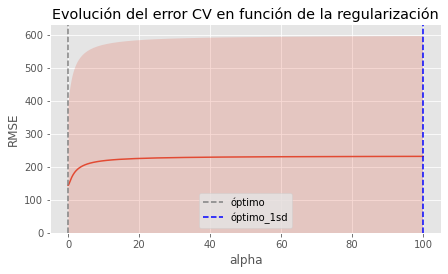

In [272]:
# Evolución del error en función de alpha
# ==============================================================================
# modelo.cv_values almacena el mse de cv para cada valor de alpha. Tiene
# dimensiones (n_samples, n_targets, n_alphas)
mse_cv = modelo.cv_values_.reshape((-1, 200)).mean(axis=0)
mse_sd = modelo.cv_values_.reshape((-1, 200)).std(axis=0)

# Se aplica la raíz cuadrada para pasar de mse a rmse
rmse_cv = np.sqrt(mse_cv)
rmse_sd = np.sqrt(mse_sd)

# Se identifica el óptimo y el óptimo + 1std
min_rmse     = np.min(rmse_cv)
sd_min_rmse  = rmse_sd[np.argmin(rmse_cv)]
min_rsme_1sd = np.max(rmse_cv[rmse_cv <= min_rmse + sd_min_rmse])
optimo       = modelo.alphas[np.argmin(rmse_cv)]
optimo_1sd   = modelo.alphas[rmse_cv == min_rsme_1sd]


# Gráfico del error +- 1 desviación estándar
fig, ax = plt.subplots(figsize=(7, 3.84))
ax.plot(modelo.alphas, rmse_cv)
ax.fill_between(
    modelo.alphas,
    rmse_cv + rmse_sd,
    rmse_cv - rmse_sd,
    alpha=0.2
)

ax.axvline(
    x         = optimo,
    c         = "gray",
    linestyle = '--',
    label     = 'óptimo'
)

ax.axvline(
    x         = optimo_1sd,
    c         = "blue",
    linestyle = '--',
    label     = 'óptimo_1sd'
)
#ax.set_xscale('log')
#ax.set_xlim([0,10])
ax.set_ylim([0,None])
ax.set_title('Evolución del error CV en función de la regularización')
ax.set_xlabel('alpha')
ax.set_ylabel('RMSE')
plt.legend();

In [273]:
# Mejor valor alpha encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")

Mejor valor de alpha encontrado: 0.0005672426068491978


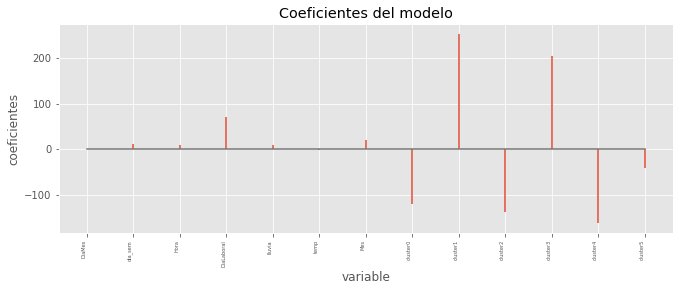

In [274]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': modelo.coef_.flatten()}
                  )

fig, ax = plt.subplots(figsize=(11, 3.84))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=5)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');

En comparación al modelo por mínimos cuadrados ordinarios, con ridge, el orden de magnitud de los coeficientes es similar.

In [275]:
# Predicciones test
# ==============================================================================
predicciones = modelo.predict(X=X_test)
predicciones = predicciones.flatten()
predicciones[:5]

array([ 202.85555675,   30.03060434,  255.39175743, -102.23482474,
         68.31629596])

In [276]:
# Error de test del modelo 
# ==============================================================================
rmse_ridge = mean_squared_error(
                y_true  = y_test,
                y_pred  = predicciones,
                squared = False
             )
print("")
print(f"El error (rmse) de test es: {rmse_ridge}")


El error (rmse) de test es: 145.50422004848542


Las predicciones del modelo final se alejan en promedio 145.5 unidades del valor real.

## LASSO

In [277]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
# ==============================================================================
# Por defecto LassoCV utiliza el mean squared error
modelo = LassoCV(
            alphas          = np.logspace(-10, 3, 200),
            normalize       = True,
            cv              = 10
         )
_ = modelo.fit(X = X_train, y = y_train)

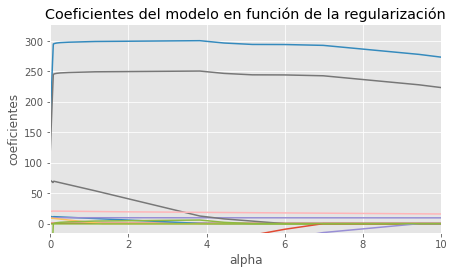

In [278]:
# Evolución de los coeficientes en función de alpha
# ==============================================================================
alphas = modelo.alphas_
coefs = []

for alpha in alphas:
    modelo_temp = Lasso(alpha=alpha, fit_intercept=False, normalize=True)
    modelo_temp.fit(X_train, y_train)
    coefs.append(modelo_temp.coef_.flatten())

fig, ax = plt.subplots(figsize=(7, 3.84))
ax.plot(alphas, coefs)
#ax.set_xscale('log')
ax.set_xlim([0,10])
ax.set_ylim([-15,None])
ax.set_xlabel('alpha')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo en función de la regularización');

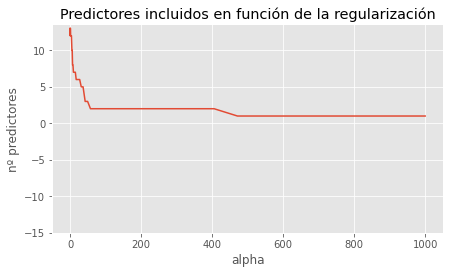

In [279]:
# Número de predictores incluidos (coeficiente !=0) en función de alpha
# ==============================================================================
alphas = modelo.alphas_
n_predictores = []

for alpha in alphas:
    modelo_temp = Lasso(alpha=alpha, fit_intercept=False, normalize=True)
    modelo_temp.fit(X_train, y_train)
    coef_no_cero = np.sum(modelo_temp.coef_.flatten() != 0)
    n_predictores.append(coef_no_cero)

fig, ax = plt.subplots(figsize=(7, 3.84))
ax.plot(alphas, n_predictores)
#ax.set_xscale('log')
ax.set_ylim([-15,None])
ax.set_xlabel('alpha')
ax.set_ylabel('nº predictores')
ax.set_title('Predictores incluidos en función de la regularización');

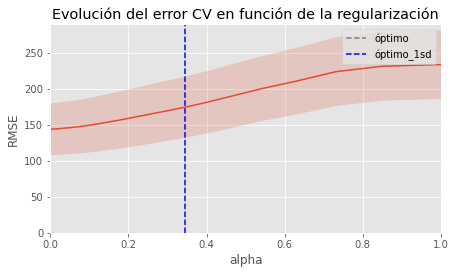

In [280]:
# Evolución del error en función de alpha
# ==============================================================================
# modelo.mse_path_ almacena el mse de cv para cada valor de alpha. Tiene
# dimensiones (n_alphas, n_folds)
mse_cv = modelo.mse_path_.mean(axis=1)
mse_sd = modelo.mse_path_.std(axis=1)

# Se aplica la raíz cuadrada para pasar de mse a rmse
rmse_cv = np.sqrt(mse_cv)
rmse_sd = np.sqrt(mse_sd)

# Se identifica el óptimo y el óptimo + 1std
min_rmse     = np.min(rmse_cv)
sd_min_rmse  = rmse_sd[np.argmin(rmse_cv)]
min_rsme_1sd = np.max(rmse_cv[rmse_cv <= min_rmse + sd_min_rmse])
optimo       = modelo.alphas_[np.argmin(rmse_cv)]
optimo_1sd   = modelo.alphas_[rmse_cv == min_rsme_1sd]

# Gráfico del error +- 1 desviación estándar
fig, ax = plt.subplots(figsize=(7, 3.84))
ax.plot(modelo.alphas_, rmse_cv)
ax.fill_between(
    modelo.alphas_,
    rmse_cv + rmse_sd,
    rmse_cv - rmse_sd,
    alpha=0.2
)

ax.axvline(
    x         = optimo,
    c         = "gray",
    linestyle = '--',
    label     = 'óptimo'
)

ax.axvline(
    x         = optimo_1sd,
    c         = "blue",
    linestyle = '--',
    label     = 'óptimo_1sd'
)

#ax.set_xscale('log')
ax.set_xlim([0,1])
ax.set_ylim([0,None])
ax.set_title('Evolución del error CV en función de la regularización')
ax.set_xlabel('alpha')
ax.set_ylabel('RMSE')
plt.legend();

In [281]:
# Mejor valor alpha encontrado + 1sd
# ==============================================================================
min_rmse     = np.min(rmse_cv)
sd_min_rmse  = rmse_sd[np.argmin(rmse_cv)]
min_rsme_1sd = np.max(rmse_cv[rmse_cv <= min_rmse + sd_min_rmse])
optimo       = modelo.alphas_[np.argmin(rmse_cv)]
optimo_1sd   = modelo.alphas_[rmse_cv == min_rsme_1sd]

print(f"Mejor valor de alpha encontrado + 1 desviación estándar: {optimo_1sd}")

Mejor valor de alpha encontrado + 1 desviación estándar: [0.34489623]


In [282]:
# Mejor modelo alpha óptimo + 1sd
# ==============================================================================
modelo = Lasso(alpha=optimo_1sd, normalize=True)
modelo.fit(X_train, y_train)

Lasso(alpha=array([0.34489623]), normalize=True)

In [283]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': modelo.coef_.flatten()}
                  )

# Predictores incluidos en el modelo (coeficiente != 0)
df_coeficientes[df_coeficientes.coef != 0]

,predictor,coef
2,Hora,2.89710
8,cluster1,212.14189
10,cluster3,162.23475


El modelo final incluye 3 predictores.

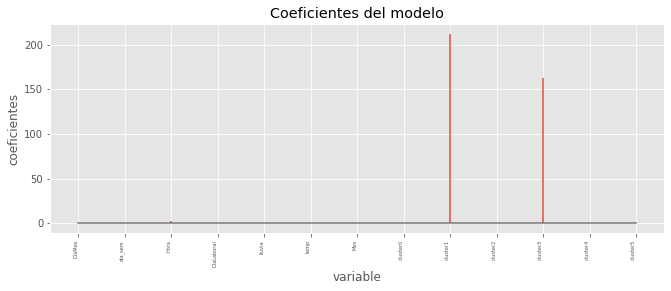

In [284]:
fig, ax = plt.subplots(figsize=(11, 3.84))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=5)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');

In [285]:
# Predicciones test
# ==============================================================================
predicciones = modelo.predict(X=X_test)
predicciones = predicciones.flatten()
predicciones[:5]

array([236.30429126, 114.62890203, 239.20138855,  76.96663723,
       111.73180474])

In [286]:
# Error de test del modelo 
# ==============================================================================
rmse_lasso = mean_squared_error(
                y_true  = y_test,
                y_pred  = predicciones,
                squared = False
             )
print("")
print(f"El error (rmse) de test es: {rmse_lasso}")


El error (rmse) de test es: 177.28986463774646


Las predicciones del modelo final se alejan en promedio 177.28 unidades del valor real.

## ELASTICNET

In [287]:
# Creación y entrenamiento del modelo (con búsqueda por CV del valor óptimo alpha)
# ==============================================================================
# Por defecto ElasticNetCV utiliza el mean squared error
modelo = ElasticNetCV(
            l1_ratio        = [0, 0.1, 0.5, 0.7, 0.9, 0.95, 0.99],
            alphas          = np.logspace(-10, 3, 200),
            normalize       = True,
            cv              = 10
         )
_ = modelo.fit(X = X_train, y = y_train)

In [288]:
# Evolución del error en función de alpha y l1_ratio
# ==============================================================================
# modelo.mse_path_ almacena el mse de cv para cada valor de alpha y l1_ratio.
# Tiene dimensiones (n_l1_ratio, n_alpha, n_folds)

# Error medio de las 10 particiones por cada valor de alpha y l1_ratio 
mean_error_cv = modelo.mse_path_.mean(axis =2)

# El resultado es un array de dimensiones (n_l1_ratio, n_alpha)
# Se convierte en un dataframe
df_resultados_cv = pd.DataFrame(
                        data   = mean_error_cv.flatten(),
                        index  = pd.MultiIndex.from_product(
                                    iterables = [modelo.l1_ratio, modelo.alphas_],
                                    names     = ['l1_ratio', 'modelo.alphas_']
                                 ),
                        columns = ["mse_cv"]
                    )

df_resultados_cv['rmse_cv'] = np.sqrt(df_resultados_cv['mse_cv'])
df_resultados_cv = df_resultados_cv.reset_index().sort_values('mse_cv', ascending = True)
df_resultados_cv

,l1_ratio,modelo.alphas_,mse_cv,rmse_cv
556,0.50000,0.00000,20695.16954,143.85816
360,0.10000,0.00000,20695.16955,143.85816
945,0.90000,0.00000,20695.16957,143.85816
160,0.00000,0.00000,20695.16959,143.85816
161,0.00000,0.00000,20695.16960,143.85816
...,...,...,...,...
1232,0.99000,8.11984,54426.10866,233.29404
1233,0.99000,6.98588,54426.10866,233.29404
1234,0.99000,6.01028,54426.10866,233.29404
1236,0.99000,4.44878,54426.10866,233.29404


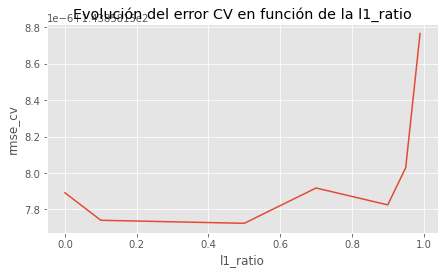

In [289]:
# Mejor valor encontrado para cada l1_ratio
fig, ax = plt.subplots(figsize=(7, 3.84))
df_resultados_cv.groupby('l1_ratio')['rmse_cv'].min().plot(ax = ax)
ax.set_title('Evolución del error CV en función de la l1_ratio')
ax.set_xlabel('l1_ratio')
ax.set_ylabel('rmse_cv');

In [290]:
# Mejor valor alpha y l1_ratio_ encontrado
# ==============================================================================
print(f"Mejor valor de alpha encontrado: {modelo.alpha_}")
print(f"Mejor valor de l1_ratio encontrado: {modelo.l1_ratio_}")

Mejor valor de alpha encontrado: 6.44236350872137e-08
Mejor valor de l1_ratio encontrado: 0.5


In [291]:
# Coeficientes del modelo
# ==============================================================================
df_coeficientes = pd.DataFrame(
                        {'predictor': X_train.columns,
                         'coef': modelo.coef_.flatten()}
                  )

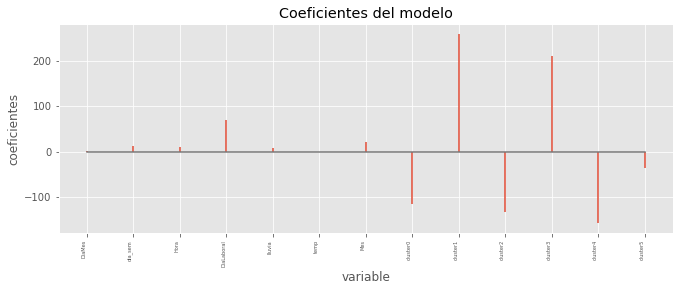

In [292]:
fig, ax = plt.subplots(figsize=(11, 3.84))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=5)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');

In [293]:
# Predicciones test
# ==============================================================================
predicciones = modelo.predict(X=X_test)
predicciones = predicciones.flatten()

In [294]:
# Error de test del modelo 
# ==============================================================================
rmse_elastic = mean_squared_error(
                y_true  = y_test,
                y_pred  = predicciones,
                squared = False
               )
print("")
print(f"El error (rmse) de test es: {rmse_elastic}")


El error (rmse) de test es: 145.50419185618975


Las predicciones del modelo final se alejan en promedio 146.35 unidades del valor real.

### COMPARACIÓN MODELOS

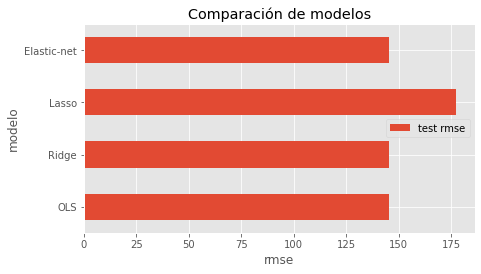

In [295]:
df_comparacion = pd.DataFrame({
                    'modelo': ['OLS', 'Ridge', 'Lasso', 'Elastic-net'],
                    'test rmse': [rmse_ols, rmse_ridge, rmse_lasso, rmse_elastic]
                 })

fig, ax = plt.subplots(figsize=(7, 3.84))
df_comparacion.set_index('modelo').plot(kind='barh', ax=ax)
ax.set_xlabel('rmse')
ax.set_ylabel('modelo')
ax.set_title('Comparación de modelos');

- Los valores rmse obtenidos con OLS y Ridge son iguales.
- Lasso y Elastic-Net no mejoran la predicción.
- OLS y Ridge con los atributos considerados aportan un grado adecuado de generalización.